#ZOODEC (Deteccion de objetos, clasificacion de animales aplicando modelo YoloV5)

#Instalacion del modelo YOLOV5, requerimientos e importación de librerias

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
!pip install roboflow

from roboflow import Roboflow
import torch
import utils
import pandas as pd
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CPU


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.4/107.7 GB disk)


In [2]:
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CPU


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.4/107.7 GB disk)


In [2]:
import os
from google.colab import drive
drive.mount('/content/drive')
path = '/content/drive/My Drive/'
os.chdir(path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()
pd.__version__

'1.3.5'

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import *
from IPython.display import Image
from sklearn.tree import export_graphviz
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from mlxtend.plotting import plot_decision_regions
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn import datasets
from sklearn.datasets import *
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import time
from sklearn.model_selection import train_test_split
%run -i /content/drive/MyDrive/ai-uis-student/code/utils.py

Graphviz already installed


#Descarga del Dataset


---



In [ ]:
torch.hub.download_url_to_file('https://app.roboflow.com/ds/SKTBynbohZ?key=GylN8T3fU7', 'tmp.zip')
!unzip -q tmp.zip -d /content/drive/MyDrive/ProyectoIAFinal/dataset && rm tmp.zip

torch.hub.download_url_to_file('https://app.roboflow.com/ds/3lSWkM1UON?key=50UwkgnyHk', 'tmp.zip')
!unzip -q tmp.zip -d /content/drive/MyDrive/ProyectoIAFinal/dataset2 && rm tmp.zip

  0%|          | 0.00/36.0M [00:00<?, ?B/s]

  0%|          | 0.00/35.9M [00:00<?, ?B/s]

In [48]:
T = '/content/drive/MyDrive/ProyectoIAFinal/dataset2/test/_annotations.csv'
T2 = '/content/drive/MyDrive/ProyectoIAFinal/dataset2/train/_annotations.csv'
V = '/content/drive/MyDrive/ProyectoIAFinal/dataset2/valid/_annotations.csv'

dt = pd.concat(
   map(pd.read_csv, [T,T2,V]), ignore_index=True)


In [6]:
dt = dt.reindex(columns=['class','filename','width','height','xmin','ymin','xmax','ymax'])
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 952 entries, 0 to 951
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   class     952 non-null    object
 1   filename  952 non-null    object
 2   width     952 non-null    int64 
 3   height    952 non-null    int64 
 4   xmin      952 non-null    int64 
 5   ymin      952 non-null    int64 
 6   xmax      952 non-null    int64 
 7   ymax      952 non-null    int64 
dtypes: int64(6), object(2)
memory usage: 59.6+ KB


In [7]:
dt = dt.drop(['filename'],axis=1)

In [8]:
dep_mean = dt.groupby('class', as_index=False).mean()
dep_mean.head(10)

,class,width,height,xmin,ymin,xmax,ymax
0,Antilope,640.0,640.0,178.000000,23.000000,378.000000,337.000000
1,Ave,640.0,640.0,293.586207,144.827586,338.465517,223.724138
2,bufalo,640.0,640.0,140.675325,110.701299,489.084416,533.116883
3,elefante,640.0,640.0,210.052023,200.953757,434.647399,469.233141
4,zebra,640.0,640.0,217.589041,177.205479,442.082192,477.474886


In [9]:
dt['class'].replace(['Antilope', 'Ave','bufalo','elefante','zebra'],[0,1,2,3,4], inplace=True) 

In [10]:
dep_mean = dt.groupby('class', as_index=False).mean()
dep_mean.head(10)

,class,width,height,xmin,ymin,xmax,ymax
0,0,640.0,640.0,178.000000,23.000000,378.000000,337.000000
1,1,640.0,640.0,293.586207,144.827586,338.465517,223.724138
2,2,640.0,640.0,140.675325,110.701299,489.084416,533.116883
3,3,640.0,640.0,210.052023,200.953757,434.647399,469.233141
4,4,640.0,640.0,217.589041,177.205479,442.082192,477.474886


In [11]:
X = dt.values[:,1:8]
y = dt.values[:,0]

print(X)
print(y)

[[640 640 308 205 597 624]
 [640 640  57  41 467 640]
 [640 640 141 191 580 554]
 ...
 [640 640 231  69 495 475]
 [640 640  53 268 190 437]
 [640 640 467 166 564 400]]
[3 2 2 3 3 2 2 4 4 3 3 3 3 3 3 1 1 2 4 4 2 2 1 3 3 3 3 3 3 3 3 3 3 4 4 2 3 3 3 3 1 3 3 3 3 3 3 3 3 3 4 2 4 4 4 3 4 4 4 4 3 3 3 3 3 3 3 3 4 4 4 4 3 4 4 2 2 4 4 4 4 4 3 3 3 3 3 3 3 3 3 2 3 3 4 4 3 4 4 2 4 4 4 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 3 3 2 2 2 2 2 1 1 3 4 4 3 3 2 3 3 3 3 3 3 3 2 2 2 2 2 2 2 3 3 3 4 4 1 2 3 3 3 3 2
 2 2 2 4 3 2 3 4 3 3 3 3 3 3 3 3 3 3 3 3 4 3 3 4 4 2 2 2 2 1 4 4 4 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 3 3 2 3 3 2 2 3 3 4 3 3 3 3 3 3 3 4 4 3 3 3 3 2 1 1 3 3 3 3 3 3 3 3 3 3 1 1 2 3 3 3 3 3 3 2 1 2 3 1 1 3 3 3 3 3 2 3 3 3 4 3 3 3 3 3 3 3 2 1 1 2 2 3 4 3 3 3 3 3 3 3 3 2 3 3 3 3 3 3 3 3 4 3 3 2 3 3 3 4 3 3 4 4 2 2 3 3 3
 3 2 2 2 2 2 2 1 1 2 2 2 3 3 3 2 2 2 3 3 3 3 3 3 3 4 4 4 4 4 3 3 3 2 2 3 3 3 3 3 3 3 3 3 3 3 2 4 4 4 3 3 3 3 3 3 3 1 1 3 4 4 4 3 3 3 3 3 3 3 3 3 3 4 3 3 3 3 3 3 1 4 4 2 3 3 2 3 4 4 4 4 3 3 2 3 2

**CLASIFICADORES Y ESTIMADORES**

In [12]:
dt.head()

,class,width,height,xmin,ymin,xmax,ymax
0,3,640,640,308,205,597,624
1,2,640,640,57,41,467,640
2,2,640,640,141,191,580,554
3,3,640,640,3,6,634,561
4,3,640,640,105,34,567,528


NB

(952, 5) (952,)


,class,width,height,xmin,ymin,xmax,ymax
0,3,640,640,308,205,597,624
1,2,640,640,57,41,467,640
2,2,640,640,141,191,580,554
3,3,640,640,3,6,634,561
4,3,640,640,105,34,567,528


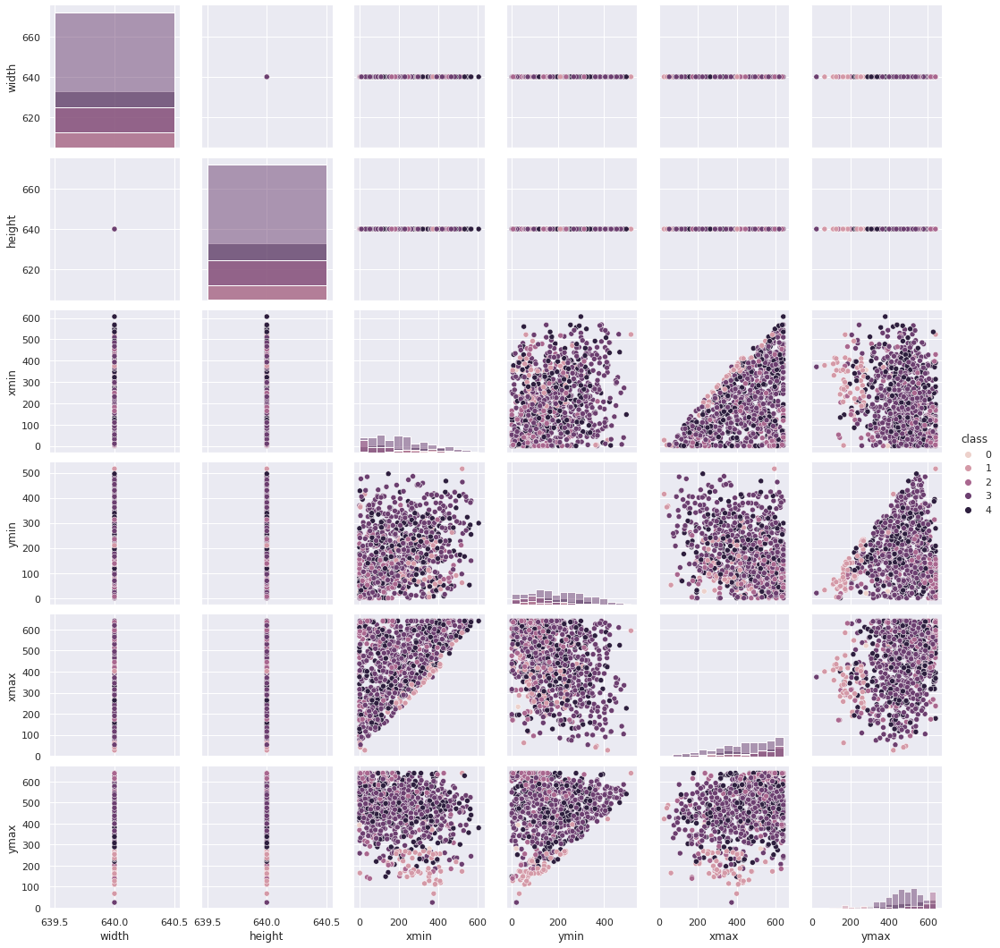

Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [13]:
X = dt.values[:,2:8]
y = dt.values[:,0]

sns.pairplot(dt, hue="class", diag_kind="hist");
print(X.shape, y.shape)


In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=21)
est = GaussianNB()
est.fit(X_train,y_train)
print("%.3f"%accuracy_score(est.predict(X_test), y_test))

0.629


In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=21)
est = GaussianNB()
est.fit(X_train,y_train)
print(accuracy_score(est.predict(X_test), y_test))


(952, 7)
0.6223776223776224


In [15]:
s = cross_val_score(est, X, y, cv=KFold(10, shuffle=True), scoring=make_scorer(accuracy_score))
print (s)
print ("accuracy %.3f (+/- %.5f)"%(np.mean(s), np.std(s)))

[    0.58333     0.66667     0.61053     0.58947     0.58947     0.61053     0.68421     0.65263     0.64211     0.58947]
accuracy 0.622 (+/- 0.03484)


In [16]:
def tpr(est,X,y):
    p = est.predict(X)
    return np.mean (p[y==1] == y[y==1])

def tnr(est,X,y):
    p = est.predict(X)
    return np.mean(p[y==0] == y[y==0])

Decision Tree

In [18]:
est = DecisionTreeClassifier(max_depth=3)
est.fit(X_train,y_train)

print(accuracy_score(est.predict(X_test), y_test))
s = cross_val_score(est, X, y, cv=KFold(10, shuffle=True), scoring=make_scorer(accuracy_score))
print("accuracy %.3f (+/- %.5f)"%(np.mean(s), np.std(s)))

0.5874125874125874
accuracy 0.623 (+/- 0.04247)


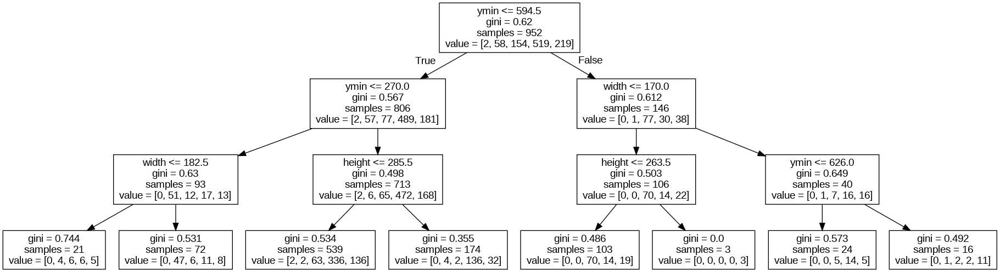

In [19]:
est.fit(X, y)

export_graphviz(est, out_file='tree_c.dot', feature_names=dt.columns[:-2].values)
!dot -Tpng tree_c.dot > tree_c.png
Image(filename='tree_c.png') 

Random Forest

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
#
# Create an instance of Random Forest Classifier
#
forest = RandomForestClassifier(criterion='gini',
                                 n_estimators=10,
                                 random_state=1,
                                 n_jobs=2)
forest.fit(X_train, y_train)

y_pred = forest.predict(X_test)
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))


Accuracy: 0.612


In [21]:
est = RandomForestClassifier()
est.fit(X_train,y_train)
print(accuracy_score(est.predict(X_test), y_test))

0.6433566433566433


In [22]:
est = RandomForestClassifier()

s = cross_val_score(est, X, y, cv=KFold(10, shuffle=True), scoring=make_scorer(accuracy_score))
print("accuracy %.3f (+/- %.5f)"%(np.mean(s), np.std(s)))



accuracy 0.637 (+/- 0.04129)


Support Vector Machine

In [23]:
est = SVC()
est.fit(X_train,y_train)
print(accuracy_score(est.predict(X_test), y_test))

0.6328671328671329


In [24]:
est = SVC()

s = cross_val_score(est, X, y, cv=KFold(10, shuffle=True), scoring=make_scorer(accuracy_score))
print("accuracy %.3f (+/- %.5f)"%(np.mean(s), np.std(s)))


accuracy 0.632 (+/- 0.03674)


#Detección


---


In [26]:
!python detect.py --weights yolov5x.pt --img 640 --conf 0.25 --iou 0.8 --source /content/drive/MyDrive/ProyectoIAFinal/dataset/valid/images

detect: weights=['yolov5x.pt'], source=/content/drive/MyDrive/ProyectoIAFinal/dataset/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.8, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CPU

100% 166M/166M [00:05<00:00, 30.9MB/s]

Fusing layers... 
YOLOv5x summary: 444 layers, 86705005 parameters, 0 gradients
image 1/94 /content/drive/MyDrive/ProyectoIAFinal/dataset/valid/images/001_jpg.rf.557ddab90d418052671d0c01880971bc.jpg: 640x640 2 elephants, 5194.3ms
image 2/94 /content/drive/MyDrive/ProyectoIAFinal/dataset/valid/images/001_jpg.rf.f8c6c7de5e18bbe865e511ff49fe29c0.jpg: 640x640 2 horses, 3362.1ms
image 3/94 /content/driv

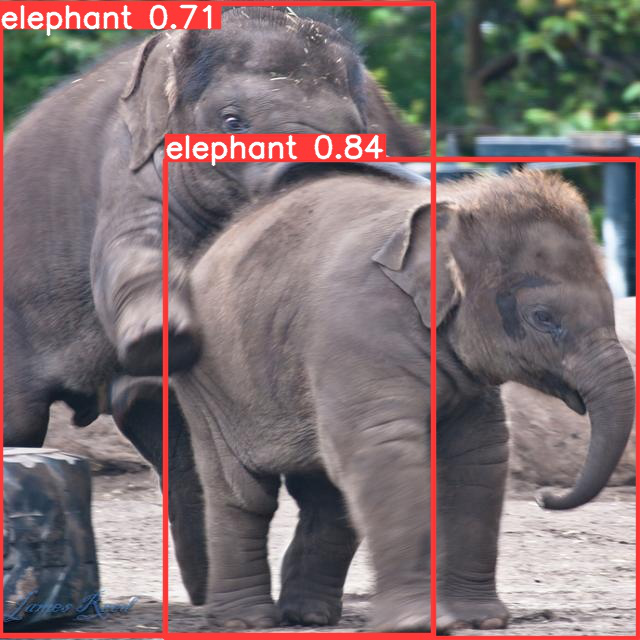

In [32]:
from PIL import Image
import IPython.display as display
display.display(Image.open('/content/yolov5/runs/detect/exp/001_jpg.rf.557ddab90d418052671d0c01880971bc.jpg'))

#Entrenamiento


---



In [36]:
!python train.py --img 640 --batch 32 --epochs 3 --data /content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml --weights yolov5x.pt --cache

train: weights=yolov5x.pt, cfg=, data=/content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=3, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv

In [38]:
!python train.py --img 640 --batch 16 --epochs 3 --data /content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=3, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv

In [47]:
!python train.py --img 640 --batch 2 --epochs 1 --data /content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml --weights yolov5m.pt --cache

train: weights=yolov5m.pt, cfg=, data=/content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1, batch_size=2, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_

In [54]:
!python train.py --img 640 --batch 2 --epochs 1 --data /content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml --weights yolov5x.pt

train: weights=yolov5x.pt, cfg=, data=/content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1, batch_size=2, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv

In [49]:
#@title Herramienta de Vizulización(evaluación de  y resultados) {run: 'auto'}
logger = 'TensorBoard' #@param ['TensorBoard', 'Comet', 'ClearML']

if logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir runs/train
elif logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'ClearML':
  %pip install -q clearml
  import clearml; clearml.browser_login()

<IPython.core.display.Javascript object>

#Validación:


---



In [50]:
# Validate YOLOv5s on COCO val
!python val.py --weights /content/yolov5/runs/train/exp6/weights/last.pt --data /content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml --img 640 

val: data=/content/drive/MyDrive/ProyectoIAFinal/dataset/data.yaml, weights=['/content/yolov5/runs/train/exp6/weights/last.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CPU

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/drive/MyDrive/ProyectoIAFinal/dataset/valid/labels.cache... 94 images, 0 backgrounds, 0 corrupt: 100% 94/94 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 3/3 [01:04<00:00, 21.50s/it]
                   all         94        179      0.728      0.279      0.243        0.1
                   Ave         94         11          1          0    

In [53]:
import torch

model = torch.hub.load('ultralytics/yolov5', 'yolov5s', force_reload=True)  
im = '/content/drive/MyDrive/ProyectoIAFinal/dataset/test/images/311_jpg.rf.181f91d4296f08f58681c753b78074b8.jpg'  
results = model(im)
results.print()

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CPU

Fusing layers... 


[Errno 2] No such file or directory: '/usr/local/lib/python3.8/dist-packages/cycler-0.11.0.dist-info/METADATA'


YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 
image 1/1: 640x640 1 person, 1 elephant
Speed: 364.3ms pre-process, 470.3ms inference, 3.8ms NMS per image at shape (1, 3, 640, 640)
